In [26]:
import nibabel as nib 
import nilearn.plotting as niplt 
import matplotlib.pyplot as plt 
import numpy as np 
import pandas as pd 
import seaborn as sns 
%matplotlib inline  

In [27]:
d="/jukebox/griffiths/bert-brains/"
#mask=nib.load(d+"21styear_data/whole_brain_mask.nii.gz").get_fdata().astype('bool')

black_subs=['sub-300', 'sub-304', 'sub-293', 'sub-273', 'sub-265', 'sub-307', 'sub-283', 'sub-275', 
'sub-291', 'sub-297', 'sub-303', 'sub-294', 'sub-286', 'sub-282', 'sub-310', 'sub-302', 'sub-312', 
'sub-301', 'sub-287', 'sub-298', 'sub-313', 'sub-285', 'sub-292', 'sub-311', 'sub-267', 'sub-295', 
'sub-305', 'sub-274', 'sub-290', 'sub-288', 'sub-281', 'sub-276', 'sub-277', 'sub-299', 'sub-308',
 'sub-272', 'sub-284', 'sub-289', 'sub-280', 'sub-309', 'sub-306', 'sub-296', 'sub-127', 'sub-279', 
 'sub-315', 'sub-314']
slumlordreach_subs=['sub-145', 'sub-143', 'sub-016', 'sub-142', 'sub-141', 'sub-133', 'sub-140', 'sub-136', 
'sub-084', 'sub-135', 'sub-137', 'sub-138', 'sub-111', 'sub-106', 'sub-134', 'sub-132', 'sub-144']

def get_multilayer_results(preference_or_variance,layer_or_z):
    results=[]
    if preference_or_variance:
        dataset=['black','slumlordreach']
    else:
        dataset=['black']
    for story in ['black']:
        results_story=[]
        if story=='black':
            subs=black_subs
        if story=='slumlordreach':
            subs=slumlordreach_subs
        
        if preference_or_variance:
            if layer_or_z:
                result_dir='/jukebox/griffiths/bert-brains/results/'+story+"/encoding_preference/"
            else:
                result_dir='/jukebox/griffiths/bert-brains/results/'+story+"/encoding_preference_z/"
        else:
            if layer_or_z:
                result_dir='/jukebox/griffiths/bert-brains/results/'+story+"/encoding_partition/"
            else:
                result_dir='/jukebox/griffiths/bert-brains/results/'+story+"/encoding_partition_z/"

        roi_mapping=np.load('/jukebox/griffiths/bert-brains/'+story+'_data/Parcel2ROI.npy')
        for sub in subs:
            results_sub_parcels=np.load(result_dir+sub+"_parcelwise_results.npy")
            #print(results_sub_parcels.shape)
            results_sub_roi=np.zeros((20,12))
            for roi in range(20):
                results_sub_roi[roi]=results_sub_parcels[np.where(roi_mapping==roi+1)].mean(axis=0) 
            #print(results_sub_parcels.shape)
          
            #results_story.append(-1*np.log(results_sub/noise_sub))
            results_story.append(results_sub_roi) 
        results_story=np.asarray(results_story)
        results.append(results_story)
    results=np.asarray(results)
    results=np.concatenate(results,axis=0)
    results[np.isnan(results)]=0.0
    return results 
        



parcellation_nii=nib.load('/jukebox/griffiths/bert-brains/black_data/Schaefer1000_3mm.nii.gz')
parcellation=parcellation_nii.get_fdata().astype('int')

In [31]:
from scipy.special import softmax
layer_partition=get_multilayer_results(0,1)
z_partition=get_multilayer_results(0,0)
layer_preference=get_multilayer_results(1,1)
z_preference=get_multilayer_results(1,0)

In [32]:
z_partition.shape

(46, 20, 12)

In [50]:
rois=['PostTemp','AntTemp','AngG','IFG','IFGorb','MFG','vmPFC','dmPFC','PMC','HG']
def do_multilayer_plot(full_data):
    for i in range(12):
        layer_number=i
        example_layer=full_data[:,:,layer_number]
        roi=[]
        performance=[]
        hemi=[]
        for i in range(example_layer.shape[0]):
            for j in range(example_layer.shape[1]):
                roi.append(rois[j%10])
                hemi.append('L' if j<10 else 'R')
                r=example_layer[i,j]
                if r<-800:
                    r=0
                performance.append(r)
        roi=np.asarray(roi)
        performance=np.asarray(performance)
        hemi=np.asarray(hemi)
        df=pd.DataFrame(dict(performance=performance,roi=roi,hemi=hemi))
        plt.figure()
        pal=sns.mpl_palette('tab10',n_colors=10)
        pal2=sns.mpl_palette('twilight',n_colors=2)
        #v=sns.violinplot(data=df,x='roi',y='performance',zorder=0,inner=None,linewidth=1,cut=0,hue='roi',alpha=0.2)
        sns.stripplot(data=df,x='roi',y='performance',hue='hemi',dodge=0.4,zorder=1,size=2,palette=pal2,order=['HG','PostTemp','AntTemp','AngG','IFG',
        'IFGorb','MFG','vmPFC','dmPFC','PMC'])
        sns.pointplot(data=df,x='roi',y='performance',hue='hemi',dodge=0.4,join=False,ci=95,n_boot=10000,capsize=0.2,zorder=2,alpha=0.5,palette=pal2,order=['HG','PostTemp','AntTemp','AngG','IFG',
        'IFGorb','MFG','vmPFC','dmPFC','PMC'])
        #sns.boxplot(x='roi',y='performance',data=df,saturation=0.35,fliersize=0)
        plt.xticks(rotation=90)
        #plt.legend(['L','R'],['C0','C1'])
        plt.axhline(y=0,color='black')
        sns.despine(top=True,right=True,left=False,bottom=False)
        my_colors=['C'+str(i) for i in range(10)]
        for ticklabel, tickcolor in zip(plt.gca().get_xticklabels(), my_colors):
            ticklabel.set_color(tickcolor)
        plt.xlabel("")
        plt.ylabel("")
        #plt.ylim(-.10,.25)
        plt.ylim(0,.002)
        plt.title("layer "+str(layer_number))





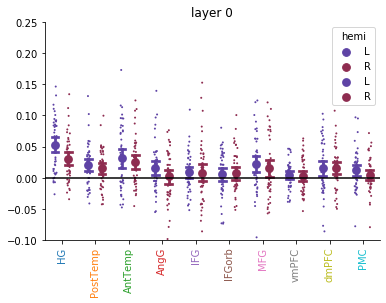

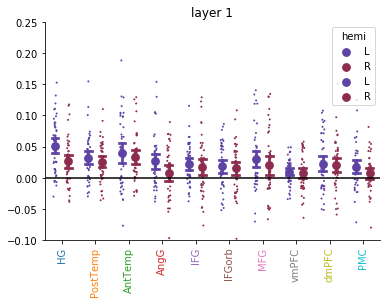

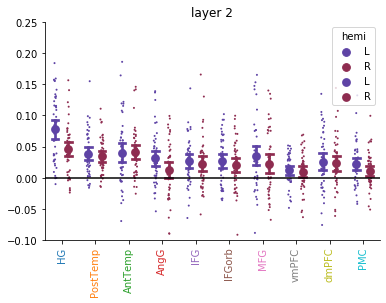

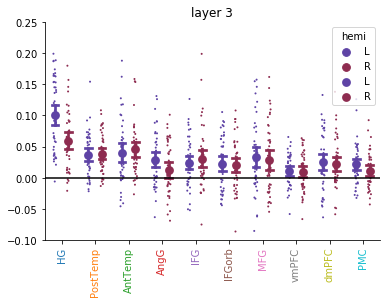

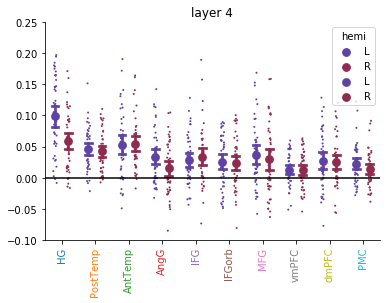

...

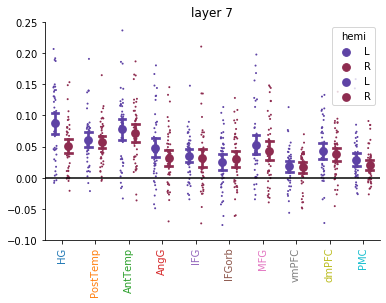

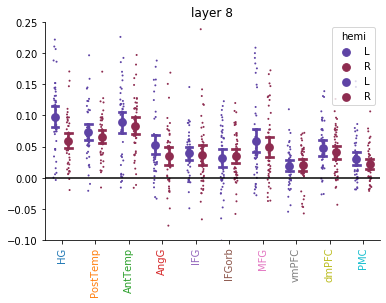

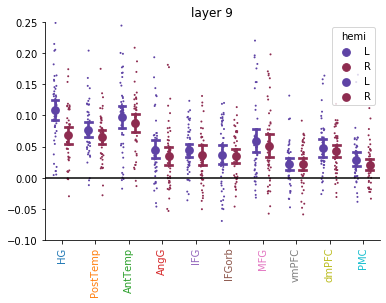

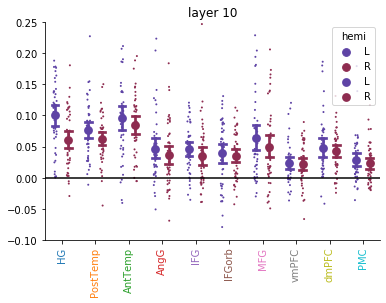

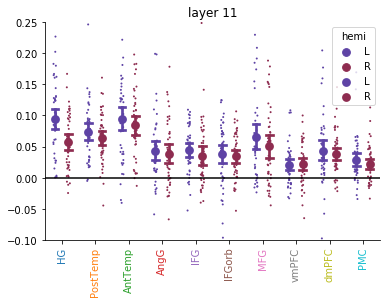

In [48]:
do_multilayer_plot(layer_preference)

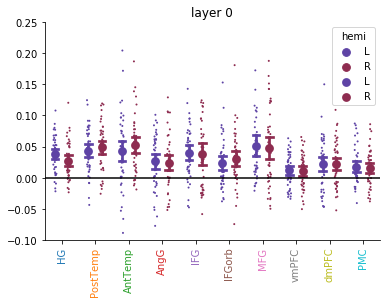

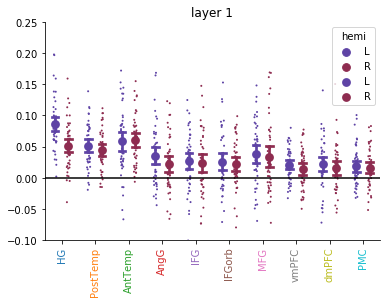

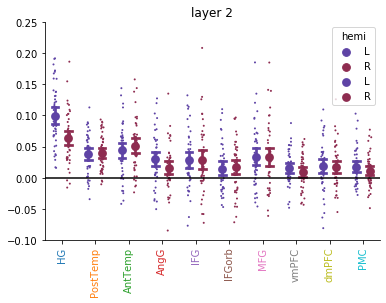

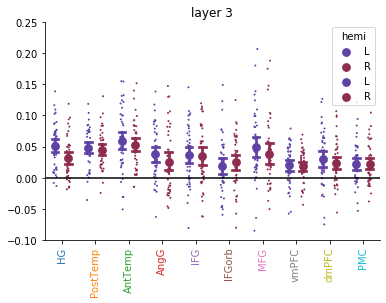

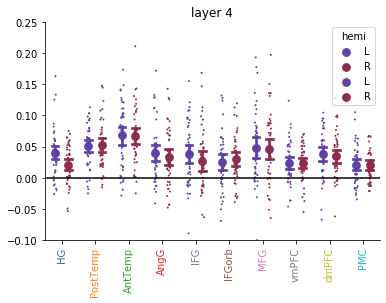

...

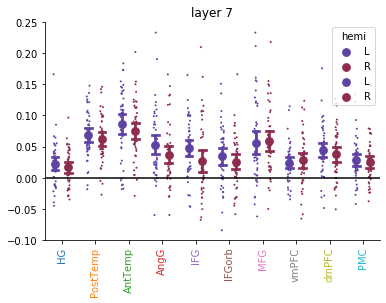

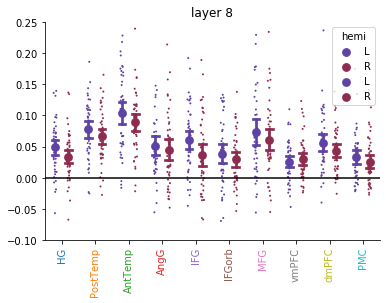

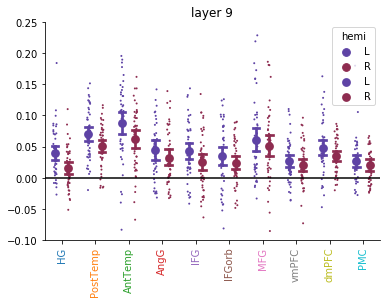

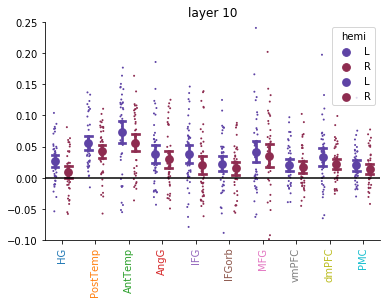

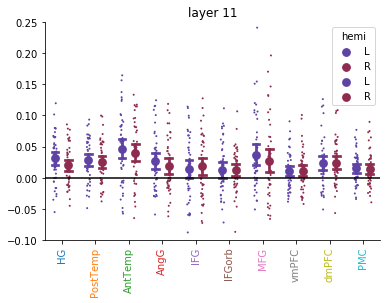

In [49]:
do_multilayer_plot(z_preference)

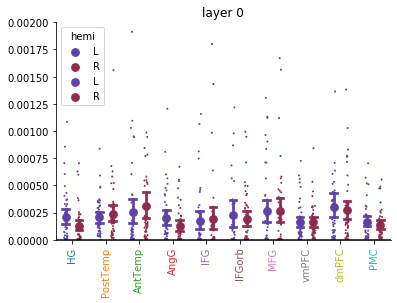

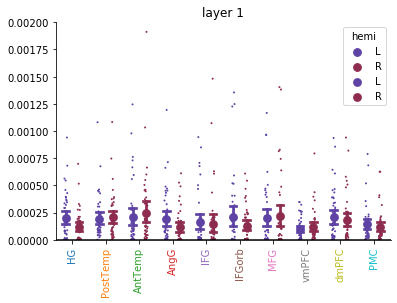

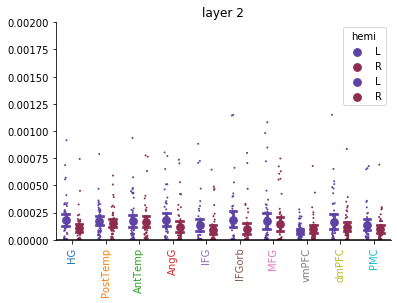

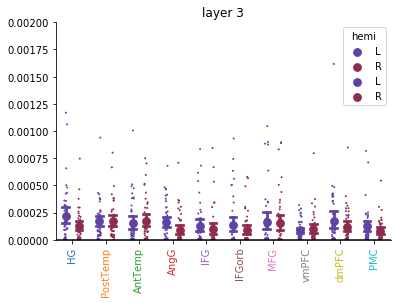

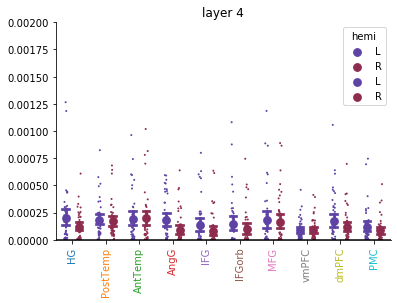

...

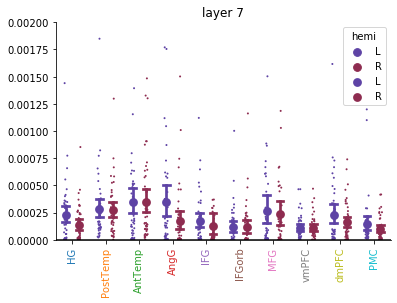

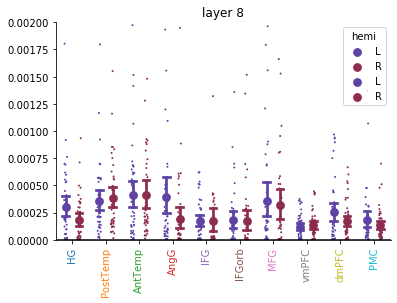

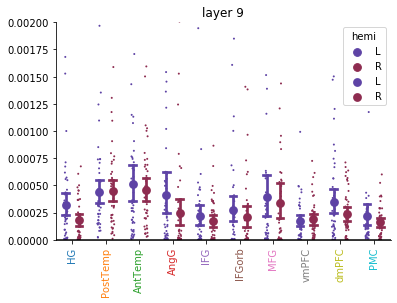

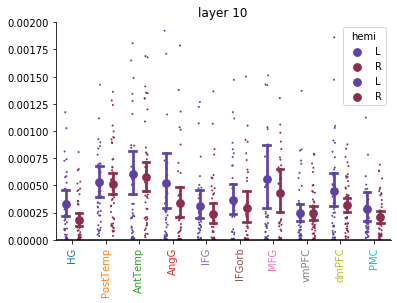

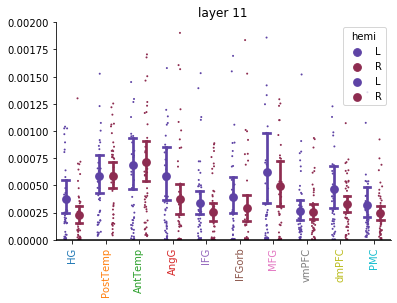

In [43]:
do_multilayer_plot(layer_partition)

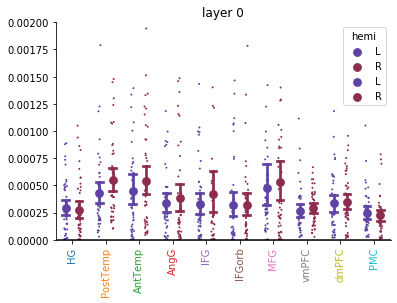

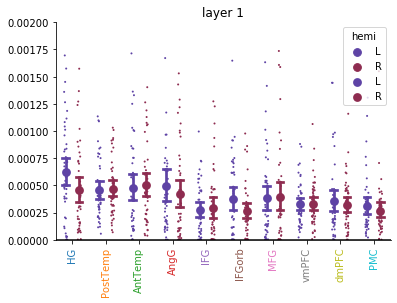

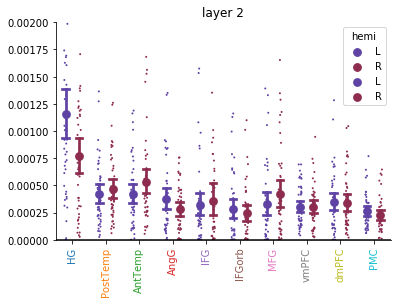

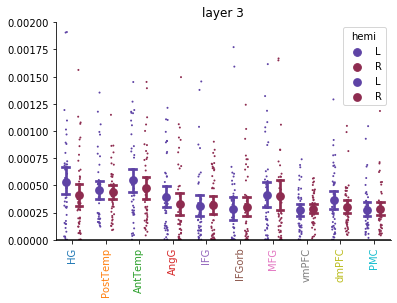

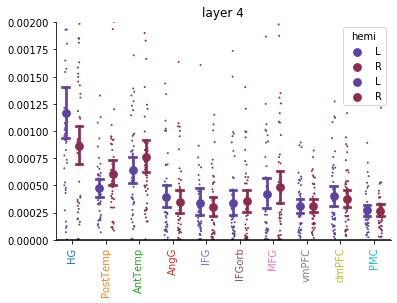

...

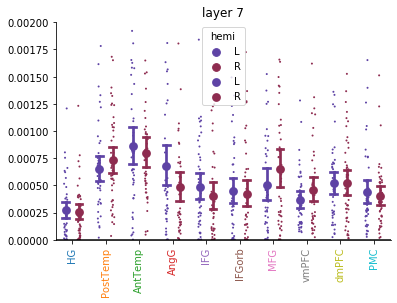

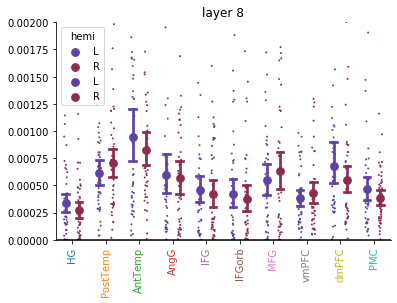

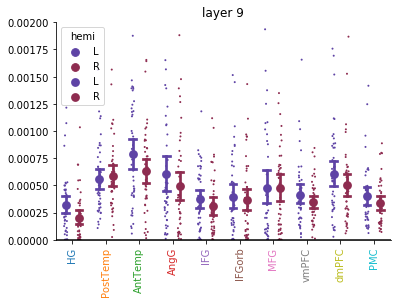

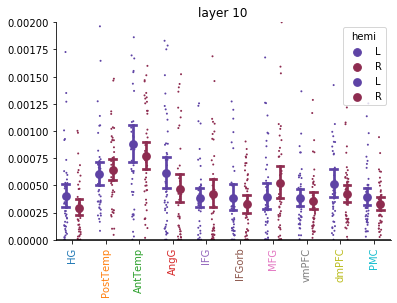

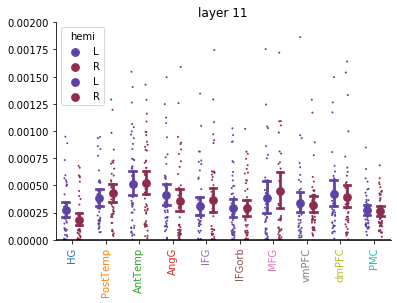

In [51]:
do_multilayer_plot(z_partition)